# Analisis generarl de la serie de tiempo
Se crea una rutina de reportes para poder visualizar el estado de la serie temporal, la idea es comenzar desde el analisis general de la serie hasta el analisis especifico como analisis mensual y diario.
Con esto se pretende generar una serie de metricas para determinar que metodos de intermpolacion podemos utilizar para la imputacion de datos ausentes.

In [1]:
import kaleido
import ephem
import numpy as np
import pandas as pd



In [2]:
from api_somo import DataFetcher, fetch_qf 
import logging

# Setting up logging for the main script
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

api_url = "http://127.0.0.1:8000/database/filter-serie/"
params = {
    "station_name": "tumaco",
    "variable_name": "Precipitación acumulada",
    "processing_level_name": "Control de calidad",
    "start_date":"2011-01-01",
    "end_date":"2011-12-31"
    }

try:
    # 1. Fetch and process the data
    historical_series = DataFetcher.fetch_and_process_data(api_url, params)

    if historical_series.empty:
        raise ValueError("The historical series is empty.")

    # Additional processing with the historical series
    logger.info(f"Fetched historical series: {historical_series.head(0)}")

except Exception as e:
    logger.error(f"Error fetching historical series: {e}")


original_line = fig_scatter(historical_series,params,color='qf')
original_line.show()
historical_series.loc[historical_series['qf'] == 9, 'value'] = np.nan
historical_series = categorize_precipitation(historical_series, params)
# Normalizar la seZrie original
historical_series['normalized_value'] = normalize_series(historical_series['value'], method='min-max')
# Filtrar los datos para omitir valores donde 'value' sea 0
#historical_series = historical_series[historical_series['value'] != 0]


print(historical_series['value'].describe())


INFO:api_somo:Sending request to http://127.0.0.1:8000/database/filter-serie/ with parameters: {'station_name': 'tumaco', 'variable_name': 'Precipitación acumulada', 'processing_level_name': 'Control de calidad', 'start_date': '2011-01-01', 'end_date': '2011-12-31'}
INFO:api_somo:Original columns: ['date_time', 'sensor_data', 'quality_flag']
INFO:api_somo:Columns after renaming: ['timestamp', 'value', 'qf']
INFO:api_somo:Timestamp conversion and indexing complete.
INFO:__main__:Fetched historical series: Empty DataFrame
Columns: [value, qf]
Index: []


NameError: name 'fig_scatter' is not defined

---
# Analisis de la calidad de la serie Historica
En este grafico podemos ver el total de datos agrupados por calidad en cada mes, es decir si una serie tiene 15 años tiene 15 eneros, 15 noviembres etc, con esta grafica podemos ver a modo general con cuantos datos del total contamos para la recuperacion de la serie y los datos faltantes, esta grafica es muy importante porque nos da  un marcador de calidad historico por meses, incluso aqui se puede analizar si la perdida de datos es sistematica o si tiene algun comportamiento con correlacion temporal.

In [3]:
from graphics_utils.express import fig_pie_month, fig_boxplot, fig_lineplot
from graphics_utils.go import multi_line, multi_boxplot
print('Serie original')
pie_fig = fig_pie_month(historical_series, params)
pie_fig.show()

#boxplot_fig = fig_boxplot(historical_series, params, color='month')
#boxplot_fig.show()

Serie original


# Redes neuronales recurentes

In [4]:
'''mes_obj = historical_series.loc['2009-03']
est02 = round(historical_series.loc['2009-02', 'value'].mean(),3)
est03 = round(historical_series.loc['2009-03', 'value'].mean(),3)
est04 = round(historical_series.loc['2009-04', 'value'].mean(),3)
a = mes_obj[mes_obj['qf'] == 9]
print(est02, est03, est04)
a'''

"mes_obj = serie_historica.loc['2009-03']\nest02 = round(serie_historica.loc['2009-02', 'value'].mean(),3)\nest03 = round(serie_historica.loc['2009-03', 'value'].mean(),3)\nest04 = round(serie_historica.loc['2009-04', 'value'].mean(),3)\na = mes_obj[mes_obj['qf'] == 9]\nprint(est02, est03, est04)\na"

1. Preparar los datos
- Asegúrate de que los datos estén normalizados o estandarizados si las variables tienen diferentes escalas.

In [5]:
'''import numpy as np
import pandas as pd
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.model_selection import train_test_split
from graphics_utils.go import multi_line  # Asegúrate de que `graphics_utils.go` esté correctamente importado

# Reemplazar valores de calidad (qf == 9) con NaN
historical_series.loc[historical_series['qf'] == 9, 'value'] = np.nan
datos = historical_series[['value']].copy()

# Crear una columna con el valor retrasado (lag)
datos['value_lag'] = datos['value'].shift(20)

# Eliminar filas con NaN en 'value' o 'value_lag' para entrenar el modelo
datos_entrenamiento = datos.dropna()

# Preprocesar los datos para la red neuronal
# Definir las variables X e Y
X = datos_entrenamiento[['value_lag']].values
y = datos_entrenamiento['value'].values

# Reshape de X para que sea compatible con el LSTM (n_samples, n_timesteps, n_features)
X = X.reshape((X.shape[0], 1, X.shape[1]))

# Dividir los datos en conjunto de entrenamiento y validación
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Crear el modelo LSTM
modelo = Sequential()
modelo.add(LSTM(50, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])))
modelo.add(Dense(1))  # Una salida (valor imputado)
modelo.compile(optimizer='adam', loss='mean_squared_error')

# Entrenar el modelo
modelo.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_val, y_val))

# Realizar predicciones sobre el conjunto de validación
y_pred = modelo.predict(X_val)

# Coeficiente de determinación (R²)
r2 = r2_score(y_val, y_pred)
print('Coeficiente de determinación (R²): ', round(r2, 2))

# Filtrar las filas donde 'value' es NaN y 'value_lag' no es NaN para imputar valores
datos_faltantes = datos.loc[datos['value'].isna() & datos['value_lag'].notna(), 'value_lag']

# Predecir los valores faltantes usando el modelo
X_faltantes = datos_faltantes.values.reshape((-1, 1, 1))  # Asegurarse de que tiene la forma correcta
datos.loc[datos_faltantes.index, 'value_imputed'] = modelo.predict(X_faltantes)

# Asegurar que 'value_imputed' esté completa (sin NaN)
datos['value_imputed'].fillna(datos['value'], inplace=True)

# Imprimir el DataFrame para ver resultados
print(datos)

# Visualizar los resultados con multi_line
fig = multi_line(CCCP=datos['value'], Imputadas=datos['value_imputed'])
fig.show()
'''

"import numpy as np\nimport pandas as pd\nfrom sklearn.metrics import r2_score\nimport matplotlib.pyplot as plt\nfrom tensorflow.keras.models import Sequential\nfrom tensorflow.keras.layers import LSTM, Dense\nfrom sklearn.model_selection import train_test_split\nfrom graphics_utils.go import multi_line  # Asegúrate de que `graphics_utils.go` esté correctamente importado\n\n# Reemplazar valores de calidad (qf == 9) con NaN\nserie_historica.loc[serie_historica['qf'] == 9, 'value'] = np.nan\ndatos = serie_historica[['value']].copy()\n\n# Crear una columna con el valor retrasado (lag)\ndatos['value_lag'] = datos['value'].shift(20)\n\n# Eliminar filas con NaN en 'value' o 'value_lag' para entrenar el modelo\ndatos_entrenamiento = datos.dropna()\n\n# Preprocesar los datos para la red neuronal\n# Definir las variables X e Y\nX = datos_entrenamiento[['value_lag']].values\ny = datos_entrenamiento['value'].values\n\n# Reshape de X para que sea compatible con el LSTM (n_samples, n_timesteps, n_f

---
## Imputación con KNN
Imputar datos faltantes utilizando los k vecinos más cercanos (k-nearest neighbors, KNN) es una técnica común y efectiva, especialmente para conjuntos de datos en los que los valores tienen una correlación espacial, temporal o de características entre ellos.

C:\Users\dreng\AppData\Local\Temp\ipykernel_29676\384475856.py:18: FutureWarning:

'w' is deprecated and will be removed in a future version, please use 'W' instead.



Mean Absolute Error (MAE): 1.9437735849056603
Mean Squared Error (MSE): 15.30577358490566
R-squared (R^2): 0.997216759331318

Comparison of Weekly Statistics:
                           Original Mean  Imputed Mean  Original Std  \
timestamp                                                              
2010-01-03 00:00:00+00:00            4.1          4.10      0.129339   
2010-01-10 00:00:00+00:00           18.9         18.90      0.174421   
2010-01-17 00:00:00+00:00          186.4        186.40      0.946604   
2010-01-24 00:00:00+00:00          290.3        290.30      1.538188   
2010-01-31 00:00:00+00:00           37.7         44.48      0.295571   
2010-02-07 00:00:00+00:00           14.7         16.50      0.084821   
2010-02-14 00:00:00+00:00          135.9        135.90      0.706044   
2010-02-21 00:00:00+00:00           56.6         56.60      0.341039   
2010-02-28 00:00:00+00:00           56.9         63.68      0.320257   
2010-03-07 00:00:00+00:00           61.8         

<Axes: title={'center': 'Comparación de estadísticas semanales'}, xlabel='timestamp'>

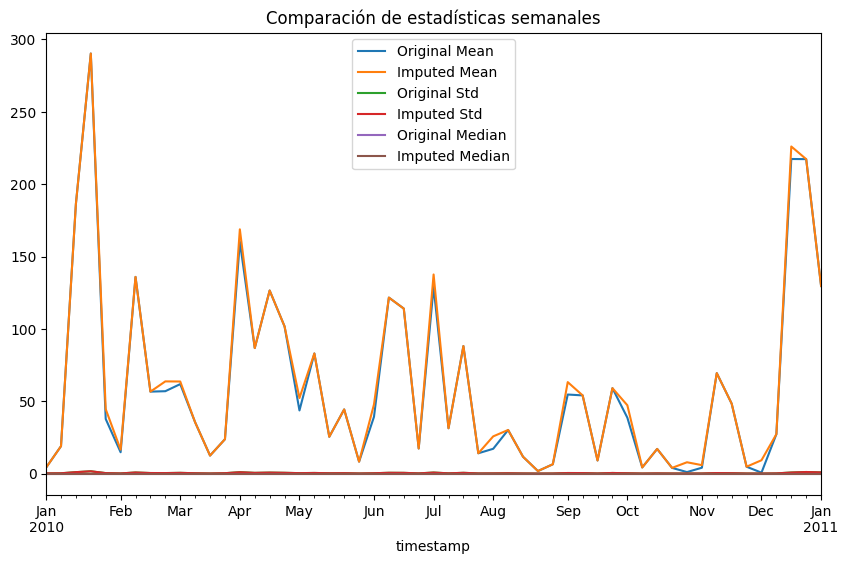

In [6]:
from sklearn.impute import KNNImputer
import numpy as np

# Imputación de valores nulos en 'value' donde 'qf' no es igual a 1
historical_series.loc[historical_series['qf'] != 1, 'value'] = np.nan

# Configurar el imputador con KNN
imputer = KNNImputer(n_neighbors=3, weights='uniform', metric='nan_euclidean')

# Copiar solo la columna 'value' y realizar la imputación
serie_knn_impitada = historical_series[['value']].copy()
# Realizar la imputación y redondear los valores a 3 decimales
serie_knn_impitada['value'] = np.round(imputer.fit_transform(serie_knn_impitada[['value']]), 2)
# Mostrar la gráfica
from graphics_utils.go import multi_line
fig_multi_line = multi_line(CCCP=historical_series['value'], Imputadas=serie_knn_impitada['value'])
fig_multi_line.show()
fig_multi_line = multi_line(CCCP=historical_series['value'].resample('w').sum(), Imputadas=serie_knn_impitada['value'].resample('w').sum())
fig_multi_line.show()
import numpy as np
import pandas as pd

# Crear estadísticas semanales para ambas series
original_weekly = historical_series['value'].resample('W').sum()
imputed_weekly = serie_knn_impitada['value'].resample('W').sum()

# 1. Calcular métricas de error entre las series originales e imputadas
mae = np.mean(np.abs(original_weekly - imputed_weekly))  # Error absoluto medio
mse = np.mean((original_weekly - imputed_weekly) ** 2)  # Error cuadrático medio
r2 = np.corrcoef(original_weekly, imputed_weekly)[0, 1] ** 2  # Coeficiente de determinación

# 2. Comparar estadísticas semanales
comparison_stats = pd.DataFrame({
    'Original Mean': original_weekly,
    'Imputed Mean': imputed_weekly,
    'Original Std': historical_series['value'].resample('W').std(),
    'Imputed Std': serie_knn_impitada['value'].resample('W').std(),
    'Original Median': historical_series['value'].resample('W').median(),
    'Imputed Median': serie_knn_impitada['value'].resample('W').median(),
})

# Mostrar resultados
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"R-squared (R^2): {r2}")
print("\nComparison of Weekly Statistics:")
print(comparison_stats)

# Opcional: Visualizar diferencias estadísticas
comparison_stats.plot(figsize=(10, 6), title="Comparación de estadísticas semanales")




# Imputacion promedio

In [7]:
from sklearn.impute import SimpleImputer
import pandas as pd


# Configurar el imputador con imputación de la media
imputer = SimpleImputer(strategy='mean')

# Realizar la imputación solo en la columna 'value' y mantener el índice 'timestamp'
serie_historica_impitada = historical_series.copy()
# Realizar la imputación y redondear los valores a 2 decimales
serie_historica_impitada['value'] = np.round(imputer.fit_transform(serie_historica_impitada[['value']]), 2)

# Mostrar la gráfica
from graphics_utils.go import multi_line, multi_boxplot

fig_multi_line = multi_line(CCCP=historical_series['value'], Imputadas=serie_historica_impitada['value'])
fig_multi_line.show()

fig_multi_line = multi_line(CCCP=historical_series['value'].resample('w').mean(), Imputadas=serie_historica_impitada['value'].resample('w').mean())
fig_multi_line.show()
# Calcular la correlación entre la serie original e imputada
correlacion = historical_series['value'].corr(serie_historica_impitada['value'])

print(f"La correlación entre la serie original e imputada es: {correlacion:.3f}")


C:\Users\dreng\AppData\Local\Temp\ipykernel_29676\3963128364.py:19: FutureWarning:

'w' is deprecated and will be removed in a future version, please use 'W' instead.



La correlación entre la serie original e imputada es: 1.000


Mean Absolute Error (MAE): 0.0016994960009089177
Mean Squared Error (MSE): 2.625575236575976e-05
R-squared (R^2): 0.9957551772856456

Comparison of Weekly Statistics:
                           Original Mean  Imputed Mean  Original Std  \
timestamp                                                              
2010-01-03 00:00:00+00:00       0.010199      0.010199      0.129339   
2010-01-10 00:00:00+00:00       0.018750      0.018750      0.174421   
2010-01-17 00:00:00+00:00       0.184921      0.184921      0.946604   
2010-01-24 00:00:00+00:00       0.287996      0.287996      1.538188   
2010-01-31 00:00:00+00:00       0.042123      0.044127      0.295571   
2010-02-07 00:00:00+00:00       0.015031      0.016369      0.084821   
2010-02-14 00:00:00+00:00       0.134821      0.134821      0.706044   
2010-02-21 00:00:00+00:00       0.056151      0.056151      0.341039   
2010-02-28 00:00:00+00:00       0.063575      0.063175      0.320257   
2010-03-07 00:00:00+00:00       0.063190 

<Axes: title={'center': 'Comparación de estadísticas semanales'}, xlabel='timestamp'>

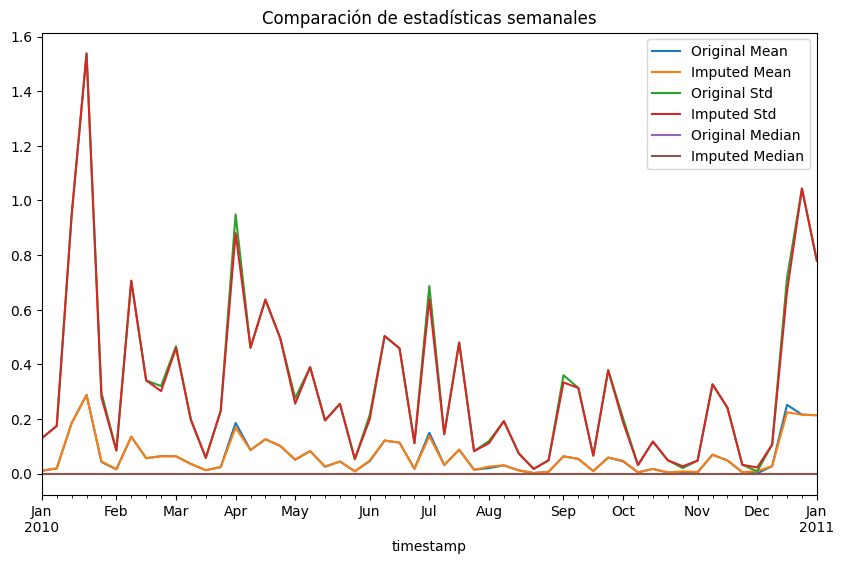

In [8]:
import numpy as np
import pandas as pd

# Crear estadísticas semanales para ambas series
original_weekly = historical_series['value'].resample('W').mean()
imputed_weekly = serie_historica_impitada['value'].resample('W').mean()

# 1. Calcular métricas de error entre las series originales e imputadas
mae = np.mean(np.abs(original_weekly - imputed_weekly))  # Error absoluto medio
mse = np.mean((original_weekly - imputed_weekly) ** 2)  # Error cuadrático medio
r2 = np.corrcoef(original_weekly, imputed_weekly)[0, 1] ** 2  # Coeficiente de determinación

# 2. Comparar estadísticas semanales
comparison_stats = pd.DataFrame({
    'Original Mean': original_weekly,
    'Imputed Mean': imputed_weekly,
    'Original Std': historical_series['value'].resample('W').std(),
    'Imputed Std': serie_historica_impitada['value'].resample('W').std(),
    'Original Median': historical_series['value'].resample('W').median(),
    'Imputed Median': serie_historica_impitada['value'].resample('W').median(),
})

# Mostrar resultados
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"R-squared (R^2): {r2}")
print("\nComparison of Weekly Statistics:")
print(comparison_stats)

# Opcional: Visualizar diferencias estadísticas
comparison_stats.plot(figsize=(10, 6), title="Comparación de estadísticas semanales")


In [9]:

# Extraer el año dinámicamente del índice
year = serie_historica_impitada.index.year[0]  # Si todos los datos son del mismo año, tomamos el primer valor

# Exportar solo las 3 primeras columnas
filename = f"{params['station_name']}_{year}_imputmean.csv"
# Seleccionar solo las 3 primeras columnas usando iloc (puedes elegir por nombre también)
serie_historica_impitada.iloc[:, :2].to_csv(filename)  # Esto selecciona las tres primeras columnas por índice

# Alternativamente, si deseas seleccionar por nombre de columna (ejemplo: 'timestamp', 'value', 'qf')
# serie_historica_impitada[['timestamp', 'value', 'qf']].to_csv(filename)

print(f"Serie imputada exportada a {filename}")




Serie imputada exportada a tumaco_2010_imputmean.csv


# Descomponer la serie temporal
Esta seccion se crea para hacer el procesamiento de descomposicion

In [10]:
"""import numpy as np
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
from graphics_utils.go import multi_line  # Asegúrate de importar correctamente tu función

# Reemplazar valores de calidad (qf == 9) con NaN
historical_series.loc[historical_series['qf'] == 9, 'value'] = np.nan

# Resample de la serie de tiempo y rellenar valores faltantes iniciales con interpolación básica
datos = historical_series

.resample('h').sum()

# Parámetros SARIMA
p, d, q = 1, 2, 1
P, D, Q, S = 1, 1, 1, 24

# Ajustar el modelo SARIMA
modelo_sarima = SARIMAX(datos['value'], order=(p, d, q), seasonal_order=(P, D, Q, S))
modelo_ajustado = modelo_sarima.fit(disp=False)

# Predecir valores (incluyendo los NaN)
# Asegurar que las predicciones no sean negativas
predicciones = modelo_ajustado.predict(start=0, end=len(datos) - 1)
predicciones[predicciones < 0] = 0


# Crear la serie imputada
serie_imputada = datos['value'].copy()
nan_indices = datos['value'].isna()  # Índices con NaN en la serie original
serie_imputada[nan_indices] = predicciones[nan_indices]  # Rellenar NaN con predicciones

# Calcular RMSE entre los valores reales (sin NaN) y las predicciones
rmse = np.sqrt(mean_squared_error(datos['value'].dropna(), predicciones[~nan_indices]))
print(f"RMSE entre los valores reales e imputados: {rmse:.2f}")

# Agregar las series al DataFrame original para visualización
datos['value_forecast'] = predicciones  # Serie de pronóstico
datos['value_imputed'] = serie_imputada  # Serie imputada combinada

# Visualizar las tres series con multi_line
fig = multi_line(
    Original=datos['value'],
    Pronóstico=datos['value_forecast'],
    Imputadas=datos['value_imputed']
)
fig.show()

# Imprimir el DataFrame con las tres series
print(datos)
"""

'import numpy as np\nimport pandas as pd\nfrom statsmodels.tsa.statespace.sarimax import SARIMAX\nfrom sklearn.metrics import mean_squared_error\nfrom graphics_utils.go import multi_line  # Asegúrate de importar correctamente tu función\n\n# Reemplazar valores de calidad (qf == 9) con NaN\nserie_historica.loc[serie_historica[\'qf\'] == 9, \'value\'] = np.nan\n\n# Resample de la serie de tiempo y rellenar valores faltantes iniciales con interpolación básica\ndatos = serie_historica.resample(\'h\').sum()\n\n# Parámetros SARIMA\np, d, q = 1, 2, 1\nP, D, Q, S = 1, 1, 1, 24\n\n# Ajustar el modelo SARIMA\nmodelo_sarima = SARIMAX(datos[\'value\'], order=(p, d, q), seasonal_order=(P, D, Q, S))\nmodelo_ajustado = modelo_sarima.fit(disp=False)\n\n# Predecir valores (incluyendo los NaN)\n# Asegurar que las predicciones no sean negativas\npredicciones = modelo_ajustado.predict(start=0, end=len(datos) - 1)\npredicciones[predicciones < 0] = 0\n\n\n# Crear la serie imputada\nserie_imputada = datos[\'